## Importing modules including TIPSY (and 'trivia_my')

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import PowerNorm
import matplotlib.cm as cm

from astropy.wcs import WCS
from astropy.io import fits
from astropy.coordinates import SkyCoord
from astropy import units as u
from spectral_cube import SpectralCube
from scipy.optimize import curve_fit
from uncertainties import ufloat, unumpy
from scipy.stats import median_abs_deviation as mad
from pvextractor import extract_pv_slice, Path

import sys
sys.path.append('/Users/agupta/Desktop/work/LateInfallESO/streamer_modelling/TIPSY')
from trivia_my import make_ppv
from tipsy import *

import os
import pickle

from scipy.interpolate import interp1d

import plotly.graph_objects as go
import imageio

%load_ext autoreload
%autoreload 2

Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


In [2]:
## Supporting functions

def make_spatial_noise_mask(file_name, vmin, vmax, dv_min, dv_max, rms_level = 3):
    '''
    Function to make a spatial mask to remove noisy pixels ideally using non pb corrected image.
    
    Arguments:
    file_name (str): Name of file to be used for mask. Preferably non primary beam corrected, as the noise is uniform.
    vmin (float) : Min. velocity of expected emission
    vmax (float) : Max. velocity of expected emission
    dv_min (float) : Min. velocity offset from channels with emission
    dv_max (float) : Max. velocity offset from channels with emission
    rms_level (float) : Sigma level to mask upto (3 by default)
    
    Output:
    mask_spatial (boolean array) :  3D mask, masking noisy pixels
    rms2use (float*flux_units) : rms flux computed
    '''

    ## Reading file 
    hdu_nocor = fits.open(file_name)[0]   # Reading file header
    cube_init_nocor = SpectralCube.read(hdu_nocor).with_spectral_unit(u.km/u.s, velocity_convention='radio',rest_value=hdu_nocor.header['RESTFRQ']*u.Hz)
    cube_init_nocor.allow_huge_operations=True # To avoid crashing

    ## Setting velocity units
    vmin *= u.km/u.s
    vmax *= u.km/u.s
    dv_min *= u.km/u.s
    dv_max *= u.km/u.s

    ## Computing rms
    cubev1 = cube_init_nocor.spectral_slab(vmin-dv_max,vmin-dv_min)  # np functions with big cubes give errors, https://spectral-cube.readthedocs.io/en/latest/big_data.html
    cubev2 = cube_init_nocor.spectral_slab(vmax+dv_min,vmax+dv_max)
    rms_val = ((np.std(cubev2[:,:,:])+np.std(cubev1[:,:,:]))/2)   # one no. 
    
    ## Creating mask based on rms_level
    rms2use = rms_val
    mask_spatial = cube_init_nocor > rms_level*rms2use

    return(mask_spatial,rms2use)

def create_disk(radius, incl_deg, PA_deg, center=(0, 0, 0), resolution=100, color='lightblue', opacity=0.5,z_sign=-1):
    """
    Create a 3D inclined disc whose projected major axis lies at PA_deg,
    measured from +Y toward +X (astronomical PA convention).

    Parameters:
        radius     : Radius of the disc
        incl_deg   : Inclination in degrees (0° = face-on, 90° = edge-on)
        PA_deg     : Position angle in degrees (from +Y toward +X)
        center     : (x, y, z) center of the disc
        resolution : Number of rim points
        color      : Disc color
        opacity    : Disc opacity
        z_sign     : If Z is positive (away from observer) or negative (towards the observer). Usually needs additional info to break degeneracy.
    """
    incl = np.radians(incl_deg)
    PA = np.radians(90 - PA_deg)  # rotate from x toward PA direction

    # Step 1: Face-on disc in x-y
    theta = np.linspace(0, 2 * np.pi, resolution)
    x = radius * np.cos(theta)
    y = radius * np.sin(theta)
    z = np.zeros_like(x)

    # Step 2: Incline around x-axis
    y_incl = y * np.cos(incl)
    z_incl = y * z_sign*np.sin(incl)
    x_incl = x

    # Step 3: Rotate around z-axis by (90 - PA)
    x_rot = x_incl * np.cos(PA) - y_incl * np.sin(PA)
    y_rot = x_incl * np.sin(PA) + y_incl * np.cos(PA)
    z_rot = z_incl

    # Step 4: Translate
    x_final = x_rot + center[0]
    y_final = y_rot + center[1]
    z_final = z_rot + center[2]

    # Add center point
    x_all = np.concatenate(([center[0]], x_final))
    y_all = np.concatenate(([center[1]], y_final))
    z_all = np.concatenate(([center[2]], z_final))

    # Triangles
    i = np.zeros(resolution - 1, dtype=int)
    j = np.arange(1, resolution)
    k = np.arange(2, resolution + 1)
    k[-1] = 1  # wrap

    return go.Mesh3d(
        x=x_all, y=y_all, z=z_all,
        i=i, j=j, k=k,
        color=color,
        opacity=opacity,
        name="Disk"
    )

def make_rotating_gif(fig, filename="rotation.gif", n_frames=36, radius=2.5,fps=7):
    """
    Generate a rotating GIF of a 3D Plotly figure.

    Parameters
    ----------
    fig : plotly.graph_objects.Figure
        The 3D Plotly figure to rotate and render.
    filename : str, optional
        Name of the output GIF file (default is "rotation.gif").
    n_frames : int, optional
        Number of frames in the rotation (default is 36).
    radius : float, optional
        Distance of the virtual camera from the scene center (default is 2.5).
    fps : int, optional
        Frames per second for the output GIF (default is 7).

    Notes
    -----
    The function rotates the camera around the figure, saves each frame,
    and compiles them into an animated GIF. Temporary image files are deleted after saving.
    """

    tmp_dir = "_tmp_frames"
    os.makedirs(tmp_dir, exist_ok=True)
    z_eye = radius / np.sqrt(3)  # to keep isometric proportion
    for i, angle in enumerate(np.linspace(0, 2*np.pi, n_frames, endpoint=False)):
        x_eye = radius * np.cos(angle)
        y_eye = radius * np.sin(angle)
        fig.update_layout(scene_camera=dict(
            eye=dict(x=x_eye, y=y_eye, z=z_eye),
            up=dict(x=0, y=0, z=1),
            center=dict(x=0, y=0, z=0)
        ))
        frame_path = f"{tmp_dir}/frame_{i:03d}.png"
        fig.write_image(frame_path, width=800, height=800)

    images = [imageio.imread(f"{tmp_dir}/frame_{i:03d}.png") for i in range(n_frames)]
    imageio.mimsave(filename, images, fps=fps)

    # Clean up
    for f in os.listdir(tmp_dir):
        os.remove(os.path.join(tmp_dir, f))
    os.rmdir(tmp_dir)


## Reading original fits file and isolating streamer

Complete file path: /Users/agupta/Desktop/work/BHB2007/fits_files/BHB1_C1_ACA_C18O_jupyter_mosaicgridder.pbcor.fits
219560354100.0


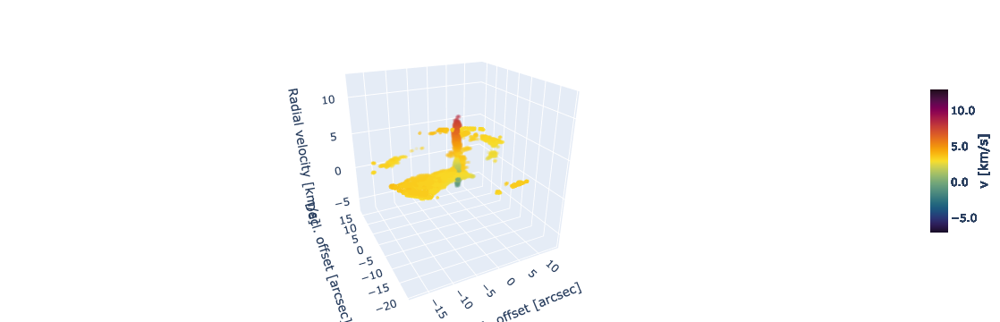

In [3]:
### Things to set here

### BHB2007
fits_dir = '/Users/agupta/Desktop/work/BHB2007/fits_files/'  # directory of fits file
output_dir = '/Users/agupta/Desktop/work/BHB2007/figures/'
fits_nam = 'BHB1_C1_ACA_C18O_jupyter_mosaicgridder.pbcor.fits'   # name of fits file
fits_fil = fits_dir + fits_nam   # complete file path
print("Complete file path:",fits_fil)

hdu = fits.open(fits_fil)[0]   # Reading file header
width = min(hdu.header['CDELT2']*(hdu.header['NAXIS2']//2),
            -(hdu.header['CDELT1']*(hdu.header['NAXIS1']//2)))*60*60 # width of the cube, used for visualisation
cube_init = SpectralCube.read(hdu).with_spectral_unit(u.km/u.s, velocity_convention='radio',rest_value=hdu.header['RESTFRQ']*u.Hz)
print(hdu.header['RESTFRQ'])

## Filtering cube, 2d mask for pbcor file
dv1 = 1*u.km/u.s
dv2 = 7*u.km/u.s
vmin = -2 #km/s
vmax = 12 #km/s
rms_level = 5
fits_fil_nocor = fits_fil.replace('.pbcor', '')
mask_spatial,rms = make_spatial_noise_mask(fits_fil_nocor, vmin, vmax, dv1.value, dv2.value, rms_level)
cube_init_masked = cube_init.with_mask(mask_spatial)

## Saving cleaned cube
scube = cube_init_masked # Cube as SpectralCube object
scube.write(fits_fil[:-5]+'_cleaned.fits',format = 'fits',overwrite = True)
fits_fil = fits_fil[:-5]+'_cleaned.fits'

## Plotting whole cube, just to see where the streamer is
make_ppv(fits_fil,show_figure = True,projection_z = False
         ,write_pdf = False,write_html = False#,out_filename='BHB2007_'+str(np.round(hdu.header['RESTFRQ']*10**-9,1))
         ,clip =0,vmin=-7,vmax=13,rmax=0.7*width,vunit_per_s = 'km'
         # ,clip =3,vmin=0,vmax=10,rmax=0.5*width#,vunit_per_s = 'km'
         ,bool_traj = False)

In [4]:
mask_nam = fits_nam.split('.')[0]+'.mask.fits'   # name of fits file
mask_fil = fits_dir + mask_nam   # complete file path

mask_data = fits.getdata(mask_fil)[0]
binary_mask = mask_data.astype(bool)
inverted_mask = ~binary_mask  # True becomes False and vice versa
masked_cube = scube.with_mask(inverted_mask)

masked_fits_nam = fits_fil.replace('.fits','_masked.fits')
masked_cube.write(masked_fits_nam, overwrite=True)

## Plotting whole cube, just to see where the streamer is
make_ppv(masked_fits_nam,show_figure = True,projection_z = False
         ,write_pdf = False,write_html = False#,out_filename='BHB2007_'+str(np.round(hdu.header['RESTFRQ']*10**-9,1))
         ,clip =5,vmin=-7,vmax=13,vunit_per_s = 'km'
         # ,clip =3,vmin=0,vmax=10,rmax=0.5*width#,vunit_per_s = 'km'
         ,bool_traj = False)

In [5]:
## Limits for extracting subcube with streamer
vmin_s = 2    # Min. vel. of streamer
vmax_s = 5
xmin_s = -20   # Min R.A. offset to consider for streamer
xmax_s = 0
ymin_s = -20   # Min. Decl. offset to consider for stremar
ymax_s = 0
# rms_thresh = 3  # sigma threshold for stremer
rms_thresh = 0  # sigma threshold for stremer, zero because already cleaned the input cube

## Stellar properties
Ms_val = 2.23 *u.solMass #Mass in solar mass
dist = 163*u.pc #Distance with units, from Gaia parallax
svel = 3.6*u.km/u.s #Systemic velocity from C18O(usually in km/s)

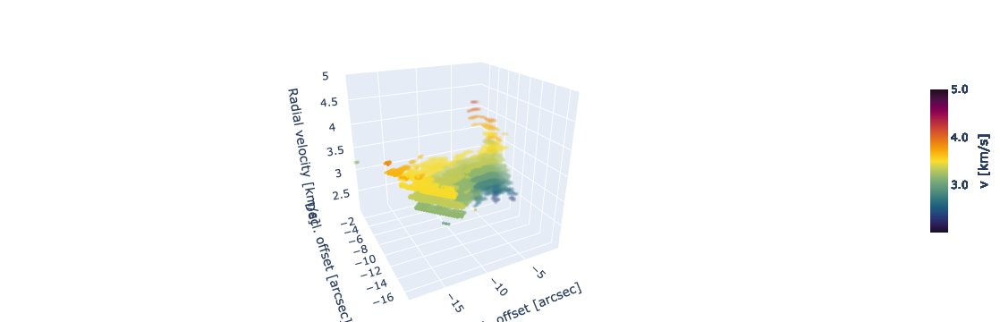

In [6]:
## Extracting subcube with streamer
scubevc2 = streamer_subcube(masked_cube,xmin_s,xmax_s,ymin_s,ymax_s,vmin_s,vmax_s,rms_thresh=rms_thresh)

scubevc2.write(fits_fil[:-5]+'_streamer-1.fits',format = 'fits',overwrite = True)
make_ppv(fits_fil[:-5]+'_streamer-1.fits',show_figure = True,projection_z = False,write_pdf = False,write_html = False
         ,clip =0,rmax = width*1,vunit_per_s = 'km'
         ,bool_traj = False)
os.remove(fits_fil[:-5]+'_streamer-1.fits') 

Clustering model: OPTICS(xi=0.8)


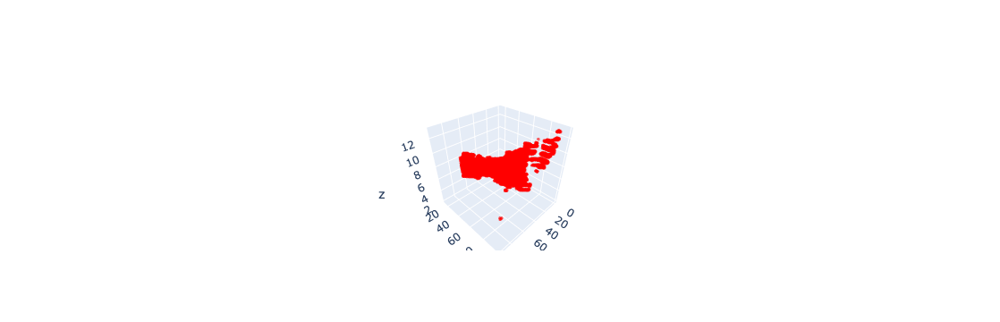

Final streamer to fit:


In [7]:
## Using clustering algorithm to remove random blobs of emission in the same subcube (optional)
scubevc3 = streamer_cleaning(scubevc2,model_args = {'xi':0.80})
print("Final streamer to fit:")
scubevc3.write(fits_fil[:-5]+'_streamer.fits',format = 'fits',overwrite = True)
# os.remove(fits_fil[:-5]+'_streamer.fits') 

In [8]:
##### Displayed isolated and cleaned streamer
scubevc3 = SpectralCube.read(fits_fil[:-5]+'_streamer.fits')
# scubevc3 = SpectralCube.read(fits_fil[:-5]+'_streamer-1.fits')
make_ppv(fits_fil[:-5]+'_streamer.fits',show_figure = True,projection_z = False,write_pdf = False,write_html = False
         ,clip =0,rmax = width*1,vunit_per_s = 'km'
         ,camera_eye_x=-1.5,camera_eye_y=1.5,camera_eye_z=1.5,write_png=False
         ,bool_traj = False)

In [9]:
print("Cleaning up..")
del cube_init

Cleaning up..


## Fittng using tipsy.traj_fitting

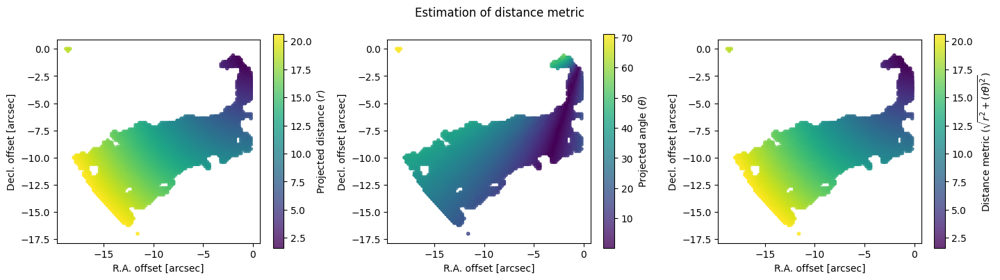

Partition boundaries for projected distances: [ 1.562  4.106  7.228  8.05   8.591  9.055  9.502  9.986 10.5   11.114
 11.683 12.343 13.148 14.002 14.931 15.926 16.981 17.975 18.928 19.85
 20.616]
Initial x0, y0 and vz0: -2413.767669973385 -2224.984925973869 -0.2091227146882284
Now for the free parameters:
Min., max. and step for initial radial sep. (z0): -1000 3000 40
Min., max. and step for initial speed in P.O.S. (vxy0): 0 1.2 0.03
Min., max. and step for initial directions in P.O.S. (vxy_ang0): 0.1818856303180295 1.6479622019932654 0.05235987755982988


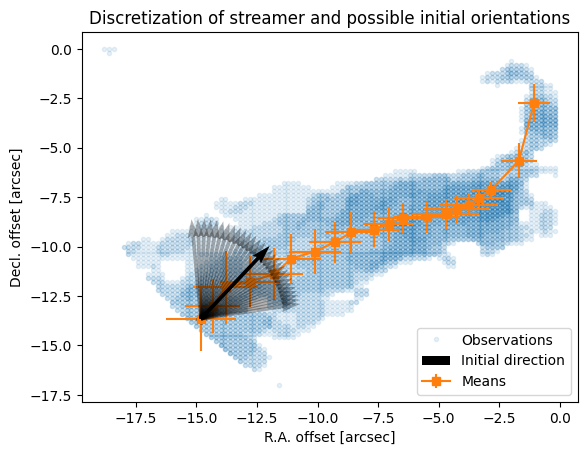

Total no. of parameter combinations: 116000
Expected time for fitting [mins]: 22.9
Time taken for fitting [mins]: 12.9
The best solution (combination index 34947):
 Fraction of fitted values: 0.98
 Deviation: 21.00
 z0 [au]: 880.00
 vxy0 [km/s]: 0.36 and vxy_ang0 [degree]: 13.4213 (vx0: 0.35 and vy0: 0.08)


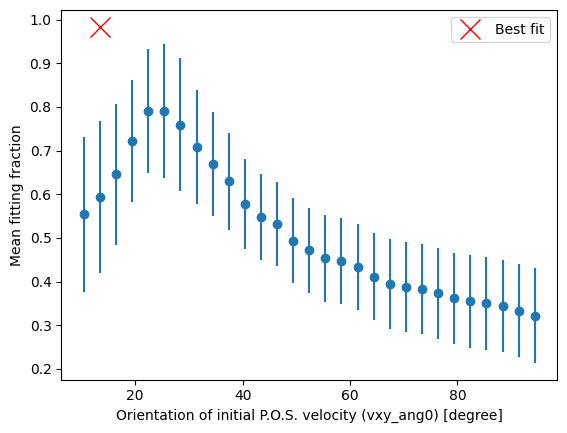

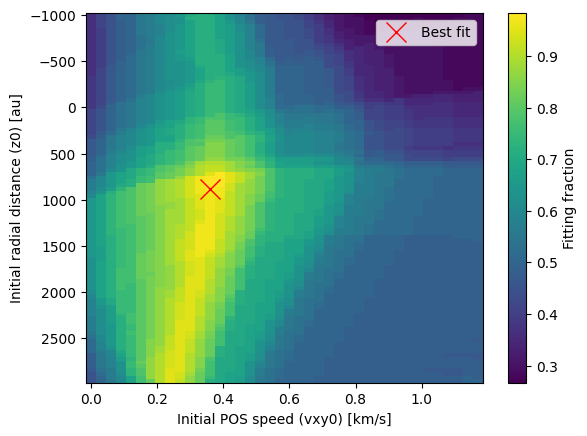

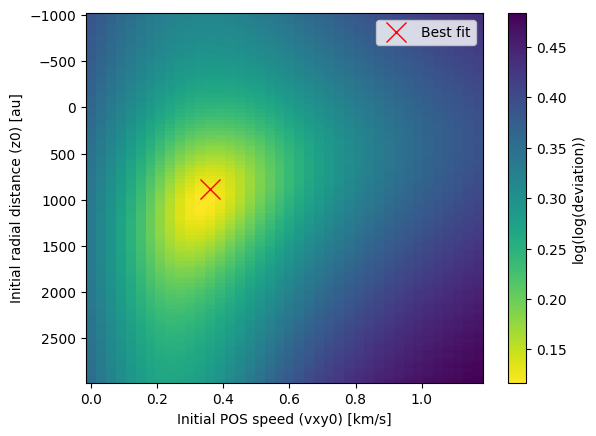

In [10]:
params,bestTraj,others = traj_fitting(scubevc3,Ms_val.value,dist,svel.value
                            ,vxy0_lim=(0,1.2),vxy0_step = 0.03
                            ,z0_lim=(-1000,3000) ,z0_step=40#30
                            ,vxy_ang0_span=90/180*np.pi,vxy_ang0_step=3/180*np.pi
                            ,N_elements=20  # Higher N_elements to get good sampling in thin neck of streamer close to disk
                            ,theta_weight=0 # Seemed to work better, default of 1 was picking up a streamer substructure 
                            ,fit2html=True,html_path=output_dir+fits_nam[:-11]+'_3Dfit.html' )
# To store results
results = [params,bestTraj,others]
with open(output_dir+fits_nam[:-11]+'_fitresults.pkl', 'wb') as f:
    pickle.dump(results, f)

## Checking errors

In [11]:
with open(output_dir+fits_nam[:-11]+'_fitresults.pkl', 'rb') as f:
    results = pickle.load(f)
params,bestTraj,others = results

In [12]:
thresh2use = 27
perrs = parameter_errors(params, criteria='deviation', threshold=0, high_threshold=thresh2use)#,mean_replace=False)
print("Threshold used:",thresh2use)
perrs

Threshold used: 27


,value,error
vxy0,0.36,0.165194
vxy_ang0,0.234246,0.086153
z0,880.0,240.522514
final_time,17241.98685,2002.715254
vx0,0.350168,0.160844
vy0,0.083559,0.048788


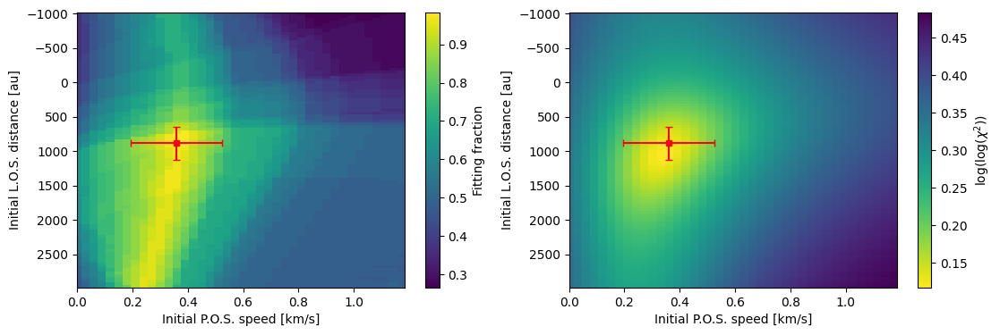

In [13]:
## Make plots to show goodness-of-fit parameters for the parameter space

# Setting up some things
grid2display = params[params['vxy_ang0']==perrs.value['vxy_ang0']] # Selecting slice with the best vxy_ang0
cmap = plt.cm.viridis
# cmap = plt.cm.cividis
cmap.set_bad(color='white')  # Nan values will show as red
z0_step = np.abs(np.diff(np.sort(np.unique(params.z0))[:2])[0])
vxy0_step = np.abs(np.diff(np.sort(np.unique(params.vxy0))[:2])[0])

plt.figure(figsize = (13,4))
# plt.subplots_adjust(wspace=0.2)#,hspace=0.1left=0.1,bottom=0.1,right=0.9,top=0.9)#

plt.subplot(1, 2, 1)
# Distribution of fit_fraction wrt z0 and vxy0
cfield = 'fit_fraction'
pivot_df = grid2display.pivot(index='z0', columns='vxy0', values=cfield)
pivot_df.sort_index(axis=0,inplace=True,ascending=True)
pivot_df.sort_index(axis=1,inplace=True,ascending=True)
plt.imshow(pivot_df,extent = [pivot_df.columns[0]-vxy0_step/2,pivot_df.columns[-1]+vxy0_step/2
                              ,pivot_df.index[-1]+z0_step/2,pivot_df.index[0]-z0_step/2],aspect='auto',cmap=cmap)
plt.plot(perrs.value['vxy0'],perrs.value['z0'],'rs',markersize = 5)
# plt.plot(param_m['vxy0'],param_m['z0'],'rx',markersize = 20)
plt.errorbar(x=perrs.value['vxy0'],y=perrs.value['z0'],
             xerr=perrs.error['vxy0'],yerr=perrs.error['z0'],color='red',capsize=3)#,'rx',markersize = 20)
# plt.errorbar(x=perrs.values['vxy0'],y=perrs.values['z0'],
#              xerr=perrs.errors['vxy0'],yerr=perrs.errors['z0'],color='red')#,'rx',markersize = 20)
plt.ylabel('Initial L.O.S. distance [au]')
plt.xlabel('Initial P.O.S. speed [km/s]')
plt.colorbar(label='Fitting fraction')
plt.xlim(xmin=0)
# plt.show()

plt.subplot(1, 2, 2)
# Distribution of deviation (loglog scaled) wrt z0 and vxy0
cfield = 'loglogdev'
grid2display['loglogdev'] = np.log10(np.log10(grid2display['deviation']))
pivot_df = grid2display.pivot(index='z0', columns='vxy0', values=cfield)
pivot_df.sort_index(axis=0,inplace=True,ascending=True)
pivot_df.sort_index(axis=1,inplace=True,ascending=True)
plt.imshow(pivot_df,extent = [pivot_df.columns[0]-vxy0_step/2,pivot_df.columns[-1]+vxy0_step/2
                              ,pivot_df.index[-1]+z0_step/2,pivot_df.index[0]-z0_step/2],aspect='auto',cmap=cmap.reversed())
plt.plot(perrs.value['vxy0'],perrs.value['z0'],'rs',markersize = 5)
plt.errorbar(x=perrs.value['vxy0'],y=perrs.value['z0'],
             xerr=perrs.error['vxy0'],yerr=perrs.error['z0'],color='red',capsize=3)#,'rx',markersize = 20)
# plt.errorbar(x=perrs.values['vxy0'],y=perrs.values['z0'],
#              xerr=perrs.errors['vxy0'],yerr=perrs.errors['z0'],color='red')#,'rx',markersize = 20)
plt.ylabel('Initial L.O.S. distance [au]')
plt.xlabel('Initial P.O.S. speed [km/s]')
plt.colorbar(label=r'log(log($\chi^{2}$))')
plt.xlim(xmin=0)

plt.savefig(output_dir+'FittingErrors.png',dpi=300)
plt.show()

In [14]:
### Deriving other physical parameters and their errors

# svel = 5.86
## Adding errors in xo, yo and vz0
pcmeans0 = others[1][:,-1] # Intensity-weighted means
pcstds0 = others[2][:,-1]  # Intensity-weighted standard deviations

# Change of scale/units
x0_as,y0_as,vz0_m = pcmeans0
x0 = arcsec2au(x0_as,dist)
y0 = arcsec2au(y0_as,dist) #(x0_as.to(u.radian).value*dist).to(u.au).value
vz0 = vz0_m*1e-3-svel.value
ex0_as,ey0_as,evz0_m = pcstds0
ex0 = arcsec2au(ex0_as,dist)
ey0 = arcsec2au(ey0_as,dist) #(ex0_as.to(u.radian).value*dist).to(u.au).value
evz0 = evz0_m*1e-3#-svel

perrs.loc['x0'] = [x0,ex0]
perrs.loc['y0'] = [y0,ey0]
perrs.loc['vz0'] = [vz0,evz0]

## Adding errors in K.E., P.E., and T.E.

v0_arr = perrs.loc[['vx0','vy0','vz0']]
v02 = 0
for comp in v0_arr.index:
    v02 += ufloat(v0_arr.loc[comp,'value'],v0_arr.loc[comp,'error'])**2
dum = (1*u.km/u.s)**2
v02 = dum*v02
# v0 = (v02)**(0.5)
# v0**2
ke_norm = 0.5*v02 # In (km/s)^2
print("Kinetic energy per unit mass: {:.3f}".format(ke_norm))

r0_arr = perrs.loc[['x0','y0','z0']]
r02 = 0
for comp in r0_arr.index:
    r02 += ufloat(r0_arr.loc[comp,'value'],r0_arr.loc[comp,'error'])**2
dum = (1*u.au)**2
r02 = dum*r02
r0 = (r02)**(0.5)

pe_norm = -((const.G*(Ms_val.value*u.solMass))/r0)
pe_norm = pe_norm.to((u.km/u.s)**2)
print("Gravitational potential energy per unit mass: {:.3f}".format(pe_norm))

te_norm = pe_norm+ke_norm
print("Total energy per unit mass: {:.2f}".format(te_norm))

perrs.loc['KE'] = [ke_norm.value.n,ke_norm.value.s]
perrs.loc['PE'] = [pe_norm.value.n,pe_norm.value.s]
perrs.loc['TE'] = [te_norm.value.n,te_norm.value.s]

## Adding errors in initial radial and tangential speeds

v0_ua = unumpy.uarray(v0_arr.value,v0_arr.error)
r0_ua = unumpy.uarray(r0_arr.value,r0_arr.error)
r0_ua_unit = (r0_ua/r0).value  # to make unit vector
vr0 = np.dot(v0_ua,r0_ua_unit)*(1*u.km/u.s)
print("Initial radial speed [km/s]: {:.3f}".format(vr0))
vt0 = (v02-vr0**2)**(0.5)
print("Initial tangential speed [km/s]: {:.3f}".format(vt0))

perrs.loc['vr0'] = [vr0.value.n,vr0.value.s]
perrs.loc['vt0'] = [vt0.value.n,vt0.value.s]

# Specific angular momentum
# l0 = (vt0*r0)  # Units: AU*km/s
r0xv0 = np.cross(r0_ua,v0_ua)  # Better way of directly getting specific angular momentum
l0 = (np.sum(r0xv0**2))**(0.5)
print("Specific angular momentum [AU*km/s]: {:.0f}".format(l0))
perrs.loc['l0'] = [l0.n,l0.s]

perrs.to_pickle(output_dir+fits_nam[:-11]+'_perrs.pkl')
perrs

Kinetic energy per unit mass: 0.087+/-0.067 km2 / s2
Gravitational potential energy per unit mass: -0.582+/-0.043 km2 / s2
Total energy per unit mass: -0.50+/-0.08 km2 / s2
Initial radial speed [km/s]: -0.358+/-0.133 km / s
Initial tangential speed [km/s]: 0.213+/-0.386 km / s
Specific angular momentum [AU*km/s]: 725+/-438


,value,error
vxy0,0.36,0.165194
vxy_ang0,0.234246,0.086153
z0,880.0,240.522514
final_time,17241.98685,2002.715254
vx0,0.350168,0.160844
vy0,0.083559,0.048788
x0,-2413.76767,234.753404
y0,-2224.984926,266.593578
vz0,-0.209123,0.174673
KE,0.086666,0.067254


## Better understanding streamer geometry

In [15]:
x=bestTraj[0][0]
y=bestTraj[0][1]
z=bestTraj[0][2]
r=bestTraj[2][0]

In [16]:
r_zmin = r[np.argmin(np.abs(z))]
print("Seperation when trajectory is on POS:",r_zmin)
print("Minimum seperation:",np.min(r))
print("Distance from POS at closest point of apprach:",z[np.argmin(r)])

Seperation when trajectory is on POS: 149.3906373407338
Minimum seperation: 137.57120731748398
Distance from POS at closest point of apprach: -45.85614092290061


In [17]:
r0xv0_arr = np.cross(r0_ua,v0_ua) # vector prependicular to plane of trajectory

r0xv02 = 0
for i in r0xv0_arr:
    r0xv02+=i**2
r0xv0 = r0xv02**(0.5) 
r0xv0_norm = r0xv0_arr/r0xv0  # Unit vector prependicular to plane of trajectory


r0xv0_norm_xy = r0xv0_norm.copy() 
r0xv0_norm_xy[2] = ufloat(0,0)  # Projection on POS of r0xv0_norm

r0xv0_dot = np.dot(r0xv0_norm_xy,r0xv0_norm)  # Dot product between to be used for angle between r0xv0 and POS
r0xv0_dot

0.36558960406075275+/-0.6756685076071325

In [18]:
r0xv0_norm_xy_mag = ((r0xv0_norm_xy[0]**2) + (r0xv0_norm_xy[1]**2))**0.5
# np.arccos(r0xv0_dot/r0xv0_norm_xy_mag)*180/np.pi
cos_theta = r0xv0_dot/r0xv0_norm_xy_mag/1 

theta = unumpy.arccos(cos_theta)*180/np.pi # Angle between rotational axis (r0xv0) and POS
lamda = 90-theta  # Angle between plane of trajectory and POS
print("Inclination of streamer trajectory:",lamda)

Inclination of streamer trajectory: (4+/-4)e+01


In [19]:
incl_deg=ufloat(76,2)
PA_deg=ufloat(14.4,0.5)

incl_rad = incl_deg*np.pi/180
PA_rad = PA_deg*np.pi/180
cos_incl = unumpy.cos(incl_rad)
cos_pa = unumpy.cos(PA_rad)
sin_pa = unumpy.sin(PA_rad)

z_rot = -cos_incl.item() #Should be +-, as we do not know which side is near us
# z_rot = cos_incl.item() #Should be +-, as we do not know which side is near us
x_rot = (1-cos_incl**2)*cos_pa
y_rot = -(1-cos_incl**2)*sin_pa
disk_rot_vec = [x_rot,y_rot,z_rot]
print("Unit vector along disk rotational axis:",disk_rot_vec)

Unit vector along disk rotational axis: [0.9118956658654229+/-0.01600376610556573, -0.2341350122027107+/-0.008940674937047055, -0.2419218955996679+/-0.033869710283091596]


In [20]:
stream_dot_disk_rot = np.dot(r0xv0_norm,disk_rot_vec)
misalign_rad = unumpy.arccos(stream_dot_disk_rot)
misalign_deg = misalign_rad*180/np.pi
print("Misalignment between disk and streamer rotations:",misalign_deg)

Misalignment between disk and streamer rotations: 69+/-34


In [21]:
## Saving it to perrs file
perrs.loc['Misalignment'] = [misalign_deg.n,misalign_deg.s]
perrs.to_pickle(output_dir+fits_nam[:-11]+'_perrs.pkl')

## Visualising fitted trajectory 

In [22]:
perrs_imp = perrs.loc[['x0', 'y0', 'z0', 'vx0', 'vy0', 'vz0']]
N_vals = 30
params_arr = np.random.normal(loc=perrs_imp.value,scale = perrs_imp.error,size=(N_vals,6))

x_t_arr, y_t_arr, z_t_arr, vz_t_arr = [], [], [], []

for param in params_arr:
    complete_trajectory = falling_trajectory(*list(param) + [Ms_val.value],
                                             ang_range=1.9*np.pi, ang_step=np.pi/200, verbose=False)
    x_t_arr.append(complete_trajectory[0][0])
    y_t_arr.append(complete_trajectory[0][1])
    z_t_arr.append(complete_trajectory[0][2])
    vz_t_arr.append(complete_trajectory[1][2])

x_t_arr = np.array(x_t_arr)
y_t_arr = np.array(y_t_arr)
z_t_arr = np.array(z_t_arr)
vz_t_arr = np.array(vz_t_arr)

In [23]:
pcloud = np.array(scubevc3)
rms_mask = ~np.isnan(pcloud)
flux = pcloud[rms_mask]
pcinds = np.indices(pcloud.shape)#.shape   #Array of indices of all points in streamer point cloud
pcz = pcinds[0][rms_mask]    #Individual indices for non nan values (high enough SNR)
pcy = pcinds[1][rms_mask]
pcx = pcinds[2][rms_mask]

pccoords = np.array(scubevc3.wcs.pixel_to_world_values(np.array([pcx,pcy,pcz]).T)).T   # Indices to FITS coords
pccoords[0] = (pccoords[0]-scubevc3.header['CRVAL1'])*60*60   # Coords in units of PPV diagram, R.A.
pccoords[0] = pccoords[0]*np.cos(scubevc3.header['CRVAL2']*np.pi/180) # cos(dec) correction required to get physical offsets in R.A. direction
pccoords[1] = (pccoords[1]-scubevc3.header['CRVAL2'])*60*60   # Decl.
pccoords[2] = (pccoords[2]-scubevc3.header['CRVAL3'])         # Radial Vel.

N=len(bestTraj[0][0])//2
x_t = au2arcsec(bestTraj[0][0][:N],dist)
y_t = au2arcsec(bestTraj[0][1][:N],dist)
vz_t = (bestTraj[1][2][:N]+svel.value)*1e3
pcbestTraj = np.array([x_t,y_t,vz_t])
        
fit_3d_plot(pccoords,flux=flux
            ,pcmeans=others[1],pcstds=others[2]
#             ,fit2html=True,html_path=output_dir+fits_nam[:-11]+'_3Dfit.html',dtick=2
            ,traj=pcbestTraj,traj_interp=others[0]
#             ,fit2png=True,png_path=output_dir+fits_nam[:-11]+'_3Dfit.png'
#             ,fit2png=True,png_path=output_dir+fits_nam[:-11]+'_3Dsimp.png'
            ,camera_vec=[-1.5,1.5,1.5])

In [24]:
##Comparing fitted trajectory to the original data cube

N=len(bestTraj[0][0])//2#-50
x_fit = au2arcsec(bestTraj[0][0],dist)[:N]
y_fit = au2arcsec(bestTraj[0][1],dist)[:N]
vz_fit = (bestTraj[1][2]+svel.value)[:N]

N_err = len(bestTraj[0][0])//3
x_err_fit = au2arcsec(x_t_arr,dist)[:,:N_err]
y_err_fit = au2arcsec(y_t_arr,dist)[:,:N_err]
vz_err_fit = (vz_t_arr+svel.value)[:,:N_err]

make_ppv(fits_fil,show_figure = True,projection_z = False,write_html = True#,show_colorbar=True
         ,clip =0,vmin=-2,vmax=9,vunit_per_s = 'km'
         ,constant_opacity = 0.07
         ,zaxis_title='L.O.S. velocity [km/s]'
         ,bool_traj = True, traj = [x_fit,y_fit,vz_fit]
         ,bool_traj_err = True, traj_err = [x_err_fit,y_err_fit,vz_err_fit]
         ,out_filename = output_dir+fits_nam[:-11]+'_trajectory'
         ,camera_eye_x=-1.5,camera_eye_y=1.5,camera_eye_z=1.5,write_png=True
         ,write_gif=False,gif_duration=5,gif_N_angs = 30
         # ,source_ra_off = 0,source_dec_off = 0,source_vel=svel
        )

Showing Trajectory...
Showing multiple trajectories...


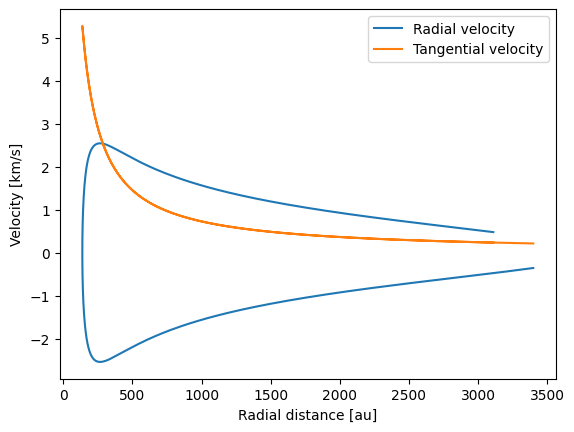

In [25]:
## Radial distance vs. velocities, to calculate inital infall rate, rotation..

plt.plot(bestTraj[2][0],bestTraj[3][0],label="Radial velocity")
plt.plot(bestTraj[2][0],bestTraj[3][2],label="Tangential velocity")
# plt.plot(bestTraj[2][0],bestTraj[3][2]*bestTraj[2][0],label="Specific angular momentum")
plt.xlabel("Radial distance [au]")
plt.ylabel("Velocity [km/s]")
plt.legend()
plt.show()

In [26]:
incl_deg=ufloat(76,2)
PA_deg=ufloat(14.4,0.5)

incl_rad = incl_deg*np.pi/180
PA_rad = PA_deg*np.pi/180
cos_incl = unumpy.cos(incl_rad)
cos_pa = unumpy.cos(PA_rad)
sin_pa = unumpy.sin(PA_rad)

z_rot = -cos_incl.item() #Should be +-, as we do not know which side is near us
# z_rot = cos_incl.item() #Should be +-, as we do not know which side is near us
x_rot = (1-cos_incl**2)*cos_pa
y_rot = -(1-cos_incl**2)*sin_pa
disk_rot_vec = [x_rot,y_rot,z_rot]
print("Unit vector along disk rotational axis:",disk_rot_vec)

Unit vector along disk rotational axis: [0.9118956658654229+/-0.01600376610556573, -0.2341350122027107+/-0.008940674937047055, -0.2419218955996679+/-0.033869710283091596]


In [27]:
## Trajectory in original cartesian domain

# N=len(bestTraj[0][0])//2-50
N = np.argmin(r)+50

traj_line = [go.Scatter3d(x=bestTraj[0][0][:N], y=bestTraj[0][1][:N], z=bestTraj[0][2][:N], mode='lines'
                          , name='Gas trajectory', line=dict(color='black', width=8))]
star = [go.Scatter3d(x=[0], y=[0], z=[0], mode='markers'
                          , name='Center of mass', marker=dict(size=9,color='red',opacity=1,symbol='diamond'))]
init = [go.Scatter3d(x=[bestTraj[0][0][0]], y=[bestTraj[0][1][0]], z=[bestTraj[0][2][0]]
                          , name='Initial position of infalling gas', mode='markers', marker=dict(size=7,color='black',opacity=1,symbol='circle'))]
# arrow = [go.Cone(x=[x_fit[0]], y=[y_fit[0]], z=[z_fit[0]], u=[vx_fit[0]], v=[vy_fit[0]], w=[vz_fit[0]]
#                  ,sizeref=0.05)]

radius_ang = 2*u.arcsec
radius_au = radius_ang.value*dist.value
incl_deg=76
PA_deg=14.4
disk = [create_disk(radius=radius_au, incl_deg=incl_deg, PA_deg=PA_deg, center=(0, 0, 0)
                    , color='royalblue')]

disk_rot = [go.Cone(x=[0], y=[0], z=[0],u=[disk_rot_vec[0].n], v=[disk_rot_vec[1].n], w=[disk_rot_vec[2].n]
                    ,sizemode="scaled",sizeref=300,anchor="tail",showscale=False
                    ,name="Disk rotation"
)]

layout = go.Layout(scene=dict(xaxis_title='R.A. offset [au]',
                      yaxis_title='Decl. offset [au]',
                      zaxis_title='Radial offset [au]',
                      ),
           margin=dict(l=0, r=0, b=0, t=0), showlegend=True,
           )

# fig = go.Figure(data=star+init+traj_line+disk,layout=layout)
fig = go.Figure(data=init+traj_line+disk+disk_rot,layout=layout)

# camera = dict(up=dict(x=0, y=1, z=0),center=dict(x=0, y=0, z=0),
#               eye=dict(x=0, y=1.5, z=-2))
camera = dict(up=dict(x=1, y=0, z=0),center=dict(x=0, y=0, z=0),
              eye=dict(x=1.25, y=1.25, z=-1.25))
fig.update_layout(scene_camera=camera)  # Set viewing angle

fig.update_layout(legend=dict(
    yanchor="top",
    y=0.95,
    xanchor="left",
    x=0.15
))
### NEED TO BRING LEGEND CLOSER..
# fig.write_image("/Users/agupta/Desktop/work/LateInfallESO/reports/tipsy_figures/SCrA_3d.png",format='png',scale=3)

# make_rotating_gif(fig,output_dir+fits_nam[:-11]+'_3d_morphology.gif')

fig.show()


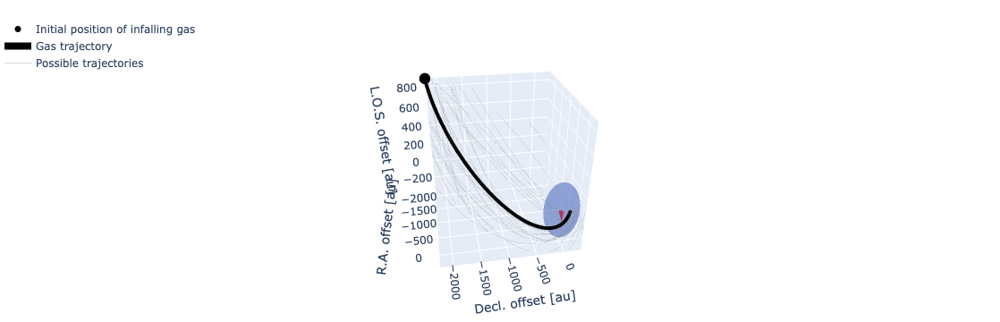

In [28]:
## Trajectory in original cartesian domain

# N=len(bestTraj[0][0])//2-50
N = np.argmin(r)+50


traj_lines_error = []
for i in range(N_vals):
    traj_lines_error += [go.Scatter3d(x=x_t_arr[i][:N], y=y_t_arr[i][:N], z=z_t_arr[i][:N], mode='lines'
                          , name='Possible trajectories', showlegend=(i == 0), line=dict(color='grey', width=0.6),opacity=0.5)]

traj_line = [go.Scatter3d(x=bestTraj[0][0][:N], y=bestTraj[0][1][:N], z=bestTraj[0][2][:N], mode='lines'
                          , name='Gas trajectory', line=dict(color='black', width=8))]
star = [go.Scatter3d(x=[0], y=[0], z=[0], mode='markers'
                          , name='Center of mass', marker=dict(size=9,color='red',opacity=1,symbol='diamond'))]
init = [go.Scatter3d(x=[bestTraj[0][0][0]], y=[bestTraj[0][1][0]], z=[bestTraj[0][2][0]]
                          , name='Initial position of infalling gas', mode='markers', marker=dict(size=7,color='black',opacity=1,symbol='circle'))]
# arrow = [go.Cone(x=[x_fit[0]], y=[y_fit[0]], z=[z_fit[0]], u=[vx_fit[0]], v=[vy_fit[0]], w=[vz_fit[0]]
#                  ,sizeref=0.05)]

radius_ang = 2*u.arcsec
radius_au = radius_ang.value*dist.value
incl_deg=76
PA_deg=14.4
disk = [create_disk(radius=radius_au, incl_deg=incl_deg, PA_deg=PA_deg, center=(0, 0, 0)
                    , color='royalblue')]

disk_rot = [go.Cone(x=[0], y=[0], z=[0],u=[disk_rot_vec[0].n], v=[disk_rot_vec[1].n], w=[disk_rot_vec[2].n]
                    ,sizemode="scaled",sizeref=200,anchor="tail",showscale=False
                    ,name="Disk rotation"
)]

y_min = np.min(bestTraj[0][1][:N])
x_min = np.min(bestTraj[0][0][:N])
z_max = np.max(bestTraj[0][2][:N])
common_title_font = dict(size=14)
layout = go.Layout(scene=dict(
                    xaxis=dict(title='R.A. offset [au]', title_font=common_title_font,range=[x_min, radius_au]),
                    yaxis=dict(title='Decl. offset [au]', title_font=common_title_font,range=[y_min, radius_au]),
                    zaxis=dict(title='L.O.S. offset [au]', title_font=common_title_font,range=[-radius_au,z_max]),
                    aspectmode='cube',
                    # zaxis=dict(range=[None, None]),
                             ),
           margin=dict(l=0, r=0, b=0, t=0, pad=0), showlegend=True,
           )

# fig = go.Figure(data=star+init+traj_line,layout=layout)
fig = go.Figure(data=init+traj_line+disk+disk_rot+traj_lines_error,layout=layout)
# fig = go.Figure(data=init+traj_line+disk+traj_lines_error,layout=layout)

camera = dict(up=dict(x=0, y=0, z=1),center=dict(x=0, y=0, z=0),
              eye=dict(x=1.5, y=1.5, z=1.5))
fig.update_layout(scene_camera=camera)  # Set viewing angle

fig.update_layout(legend=dict(
    yanchor="top",
    y=0.95,
    xanchor="left",
    x=0
))

fig.write_image(output_dir+fits_nam[:-11]+'3Dmorphology.png',format='png',scale=3, width=500)
make_rotating_gif(fig,output_dir+fits_nam[:-11]+'_3d_morphology.gif')
# create_rotating_gif(fig,output_dir+fits_nam[:-11]+'_3d_morphology.gif',n_frames=36, duration=5)
fig.write_html(output_dir+fits_nam[:-11]+'_3Dmorphology.html')
fig.show()


## Streamer mass

In [29]:
## Total flux density
v_total_flux_density = scubevc2.sum(axis=0)  # Flux integrated over each velocity, equivalent to mom0
v_total_flux_density 

## Error in flux density
data = scubevc2.unmasked_data[:]  # emission data
non_nan_counts = np.sum(~np.isnan(scubevc2), axis=0)  # no. of spexals used for flux of each pixel
e_total_flux_density = non_nan_counts*rms  # Errors for each pixel, based on overall noise times no. of pixels used
e_total_flux_density[e_total_flux_density.value==0] = np.nan 

## Combining values and errors
flux_denisty_unit = 1*scubevc2.unit
total_flux_density = unumpy.uarray(v_total_flux_density.value,e_total_flux_density.value)*flux_denisty_unit
total_flux_density

<Quantity [[nan+/-nan, nan+/-nan, nan+/-nan, ..., nan+/-nan, nan+/-nan,
            nan+/-nan],
           [nan+/-nan, nan+/-nan, nan+/-nan, ..., nan+/-nan, nan+/-nan,
            nan+/-nan],
           [nan+/-nan, nan+/-nan, nan+/-nan, ..., nan+/-nan, nan+/-nan,
            nan+/-nan],
           ...,
           [nan+/-nan, nan+/-nan, nan+/-nan, ..., nan+/-nan, nan+/-nan,
            nan+/-nan],
           [nan+/-nan, nan+/-nan, nan+/-nan, ..., nan+/-nan, nan+/-nan,
            nan+/-nan],
           [nan+/-nan, nan+/-nan, nan+/-nan, ..., nan+/-nan, nan+/-nan,
            nan+/-nan]] Jy / beam>

In [30]:
try:
    hdu_beam = fits.open(fits_fil)[1]
    bmaj = np.median(hdu_beam.data['BMAJ'])*u.arcsec
    bmin = np.median(hdu_beam.data['BMIN'])*u.arcsec
except Exception as e:
    print("Using original file because of exception:",e)
    fits_fil_beam = fits_fil.replace('_cleaned','')
    hdu_beam = fits.open(fits_fil_beam)[1]
    bmaj = np.median(hdu_beam.data['BMAJ'])*u.arcsec
    bmin = np.median(hdu_beam.data['BMIN'])*u.arcsec
    

fwhm_to_sigma = 1./(8*np.log(2))**0.5   #Just an area conversion factor
beam_area = 2.*np.pi*(bmaj*bmin*fwhm_to_sigma**2)   #Area of beam

pix_len = np.abs(hdu.header['CDELT2'])*u.deg
pix_area = (pix_len.to(u.arcsec))**2

pix_per_beam = (beam_area/pix_area)/u.beam

scube_hz = SpectralCube.read(hdu).with_spectral_unit(u.Hz, velocity_convention='radio')#,rest_value=hdu.header['RESTFRQ']*u.Hz)
freq_res = np.abs(scube_hz.header['CDELT3'])*u.Hz

flux = ((freq_res/pix_per_beam)*total_flux_density).to(u.watt*(u.m**-2))
print("Total flux:",np.nansum(flux)) # Integrated line flux, units similar to W m−2 

Using original file because of exception: list index out of range
Total flux: (1.8449+/-0.0028)e-20 W / m2


In [31]:
mH = 1.6735575e-24*u.g  # mass of Hydrogen atom
D = dist  # Distance to the source

T_val = ufloat(25,5) 
# T_val = ufloat(15,5) 
# T_val = ufloat(20,10) 
T_unit = 1*u.K
T = T_val*T_unit # This is workaround to combine ufloat and astropy.units...

In [32]:
# Einstein coeff, https://home.strw.leidenuniv.nl/~moldata/datafiles/
A_trans={              
    'CO':np.abs(-6.910e-07/u.s),
    '13CO':np.abs(-6.038e-7/u.s),
    'C18O':np.abs(-6.011e-07/u.s) 
}
# Upper state energy in K, https://home.strw.leidenuniv.nl/~moldata/datafiles/
Eu={
    'CO': 16.60*u.K,
    '13CO': 15.87*u.K,
    'C18O': 15.81*u.K
}
# Partition function values, from https://cdms.astro.uni-koeln.de/classic/predictions/catalog/partition_function.html
lgQ_18_75={
    'CO': 0.8526,
    '13CO': 1.1722,
    'C18O': 0.8728
}
lgQ_37_50={
    'CO': 1.1429,
    '13CO': 1.4630,
    'C18O': 1.1636
}
# Abundace of molecule relative to H2
# From CO to H2 ratio (roughly from Table 1, order of magnitude) and Isotope ratios (Table 4) in https://articles.adsabs.harvard.edu/pdf/1994ARA%26A..32..191W
x={
    'CO':1e-4,
    '13CO':(1/77)*1e-4,
    'C18O': (1/560)*1e-4
}

## Getting line and transition details
mol_line = 'C18O'
freq = hdu.header['RESTFRQ']*u.Hz  # line frequency
A_trans_mol  = A_trans[mol_line]  # Einstein coeff, https://home.strw.leidenuniv.nl/~moldata/datafiles/13co.dat
Eu_mol = Eu[mol_line]  # Upper state energy in K, https://home.strw.leidenuniv.nl/~moldata/datafiles/13co.dat
x_mol =  x[mol_line] # Abundace of molecule relative to H2, CHECK

## Geting parition function
lgQ_18_75_mol = lgQ_18_75[mol_line]
lgQ_37_50_mol = lgQ_37_50[mol_line]
lgQ_T_mol = lgQ_18_75_mol+((lgQ_37_50_mol-lgQ_18_75_mol)/(37.50*u.K -18.75*u.K))*(T-18.75*u.K ) # Interpolating between two temperatures
Q_T_mol = 10**lgQ_T_mol

fu = 3*unumpy.exp((Eu_mol/T).value)/Q_T_mol  # fractional of molecules in upper energy level

print(Q_T_mol,fu)

9.3+/-1.7 0.61+/-0.18


In [33]:
Mgas1 = (2.37*mH*4*np.pi*(D**2)*flux)/(A_trans_mol*const.h*freq*x_mol*fu) # Mass of gas corresponding to flux, same dimensions as flux
Mgas_val_sm = Mgas1.value * Mgas1.unit.to(u.solMass) # Multiplying mass values with a conversion factor to change units to solMass
Mgas_unit = 1*u.solMass # just multiplying with 'u.solMass' will not work 
Mgas_C1 = Mgas_val_sm*Mgas_unit # Workaround to make astropy.units and uncertainties work together
total_Mgas_C1 = np.nansum(Mgas_C1)  # This is a lower limit because of missing flux
"Total C1 mass of streamer: {:e} or {:e}".format(total_Mgas_C1,total_Mgas_C1.to(u.M_jup))

'Total C1 mass of streamer: (1.2+/-0.4)e-03 solMass or (1.3+/-0.4)e+00 jupiterMass'

In [34]:
## Correcting for missing flux using mass estimate from standalone ACA, within 17.5 arcsec for fair comparison
v_total_Mgas_ACA = 6.6e-4#*u.solMass
e_total_Mgas_ACA = 2.0e-4#*u.solMass
unit_total_Mgas_ACA = 1*u.solMass
total_Mgas_ACA = ufloat(v_total_Mgas_ACA,e_total_Mgas_ACA)*unit_total_Mgas_ACA  # Mass measured in ACA standalone data
missing_mass_fac = total_Mgas_ACA/total_Mgas_C1
print("Factor of mass missing in C1 observations:",missing_mass_fac)
if np.isclose(missing_mass_fac.value.n,1,atol=0.2):  # If missing_mass_fac is close to 1, that means the correction is not needed
    missing_mass_fac = 1
    print("Setting missing_mass_fac as 1, since it already close enough")

correct_missing_mass = False
if correct_missing_mass:
    Mgas = missing_mass_fac.value*Mgas_C1
    total_Mgas_C1 = np.nansum(Mgas)  # This is a lower limit because of missing flux
    print("Correcting for missing mass...")
else:
    Mgas = Mgas_C1
total_Mgas = total_Mgas_C1
"Total observed mass of streamer: {:e} or {:e}".format(total_Mgas,total_Mgas.to(u.M_jup))    

Factor of mass missing in C1 observations: 0.53+/-0.23


'Total observed mass of streamer: (1.2+/-0.4)e-03 solMass or (1.3+/-0.4)e+00 jupiterMass'

In [35]:
M_infrate = total_Mgas/(perrs.loc['final_time',:].value*u.yr)
M_infrate_mj_myr = M_infrate.to(u.M_jup/u.Myr)
print(f"Average mass infall rate is {M_infrate} or {M_infrate_mj_myr}")

Average mass infall rate is (7.2+/-2.2)e-08 solMass / yr or 75+/-23 jupiterMass / Myr


In [36]:
Mdisk = 3.8*u.M_jup
ReplenishTime = Mdisk/M_infrate_mj_myr
print("Time to replenish the disk via streamer:",ReplenishTime)

Time to replenish the disk via streamer: 0.051+/-0.015 Myr


In [37]:
## Saving it to perrs file
perrs.loc['Minf_rate'] = [M_infrate_mj_myr.value.n,M_infrate_mj_myr.value.s]
perrs.to_pickle(output_dir+fits_nam[:-11]+'_perrs.pkl')

## Envelope mass

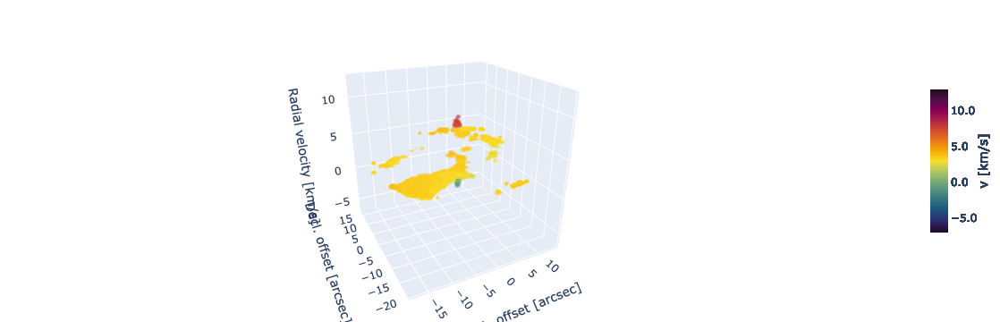

In [38]:
## Plotting whole cube, just to see where the streamer is
make_ppv(masked_fits_nam,show_figure = True,projection_z = False
         ,write_pdf = False,write_html = False#,out_filename='BHB2007_'+str(np.round(hdu.header['RESTFRQ']*10**-9,1))
         ,clip =0,vmin=-7,vmax=13,vunit_per_s = 'km'
         # ,clip =3,vmin=0,vmax=10,rmax=0.5*width#,vunit_per_s = 'km'
         ,bool_traj = False)

In [39]:
vmin_env = vmin_s    # Min. vel. of streamer
vmax_env = vmax_s
xmin_env = xmin_s   # Min R.A. offset to consider for streamer
xmax_env = abs(xmin_s)
ymin_env = ymin_s   # Min. Decl. offset to consider for stremar
ymax_env = abs(ymin_env)
print("Parameters used to get envelope emission:",vmin_env,vmax_env,xmin_env,xmax_env,ymin_env,ymax_env)

Parameters used to get envelope emission: 2 5 -20 20 -20 20


In [40]:
## Extracting subcube with streamer
scube_env = streamer_subcube(masked_cube,xmin_env,xmax_env,ymin_env,ymax_env,vmin_env,vmax_env,rms_thresh=rms_thresh)

scube_env.write(fits_fil[:-5]+'_envelope.fits',format = 'fits',overwrite = True)
make_ppv(fits_fil[:-5]+'_envelope.fits',show_figure = True,projection_z = False,write_pdf = False,write_html = False
         ,clip =0,rmax = width*1,vunit_per_s = 'km'
         ,bool_traj = False)
os.remove(fits_fil[:-5]+'_envelope.fits') 

In [41]:
## Total flux density
v_total_flux_density_env = scube_env.sum(axis=0)  # Flux integrated over each velocity, equivalent to mom0
v_total_flux_density_env 

<Projection [[nan, nan, nan, ..., nan, nan, nan],
             [nan, nan, nan, ..., nan, nan, nan],
             [nan, nan, nan, ..., nan, nan, nan],
             ...,
             [nan, nan, nan, ..., nan, nan, nan],
             [nan, nan, nan, ..., nan, nan, nan],
             [nan, nan, nan, ..., nan, nan, nan]] Jy / beam>

In [42]:
## Error in flux density
data_env = scube_env.unmasked_data[:]  # emission data
non_nan_counts_env = np.sum(~np.isnan(scube_env), axis=0)  # no. of spexals used for flux of each pixel
e_total_flux_density_env = non_nan_counts_env*rms  # Errors for each pixel, based on overall noise times no. of pixels used
e_total_flux_density_env[e_total_flux_density_env.value==0] = np.nan 

## Combining values and errors
total_flux_density_env = unumpy.uarray(v_total_flux_density_env.value,e_total_flux_density_env.value)*flux_denisty_unit
total_flux_density_env

<Quantity [[nan+/-nan, nan+/-nan, nan+/-nan, ..., nan+/-nan, nan+/-nan,
            nan+/-nan],
           [nan+/-nan, nan+/-nan, nan+/-nan, ..., nan+/-nan, nan+/-nan,
            nan+/-nan],
           [nan+/-nan, nan+/-nan, nan+/-nan, ..., nan+/-nan, nan+/-nan,
            nan+/-nan],
           ...,
           [nan+/-nan, nan+/-nan, nan+/-nan, ..., nan+/-nan, nan+/-nan,
            nan+/-nan],
           [nan+/-nan, nan+/-nan, nan+/-nan, ..., nan+/-nan, nan+/-nan,
            nan+/-nan],
           [nan+/-nan, nan+/-nan, nan+/-nan, ..., nan+/-nan, nan+/-nan,
            nan+/-nan]] Jy / beam>

In [43]:
flux_env = ((freq_res/pix_per_beam)*total_flux_density_env).to(u.watt*(u.m**-2))
print("Total flux:",np.nansum(flux_env)) # Integrated line flux, units similar to W m−2 

Total flux: (2.3632+/-0.0031)e-20 W / m2


In [44]:
Mgas_env1 = (2.37*mH*4*np.pi*(D**2)*flux_env)/(A_trans_mol*const.h*freq*x_mol*fu) # Mass of gas corresponding to flux, same dimensions as flux
Mgas_env_val_sm = Mgas_env1.value * Mgas_env1.unit.to(u.solMass) # Multiplying mass values with a conversion factor to change units to solMass
Mgas_env_unit = 1*u.solMass # just multiplying with 'u.solMass' will not work 
Mgas_env = Mgas_env_val_sm*Mgas_env_unit # Workaround to make astropy.units and uncertainties work together

total_Mgas_env = np.nansum(Mgas_env)
print("Total observed mass of envelope: {:e} or {:e}".format(total_Mgas_env,total_Mgas_env.to(u.M_jup)))

Total observed mass of envelope: (1.6+/-0.5)e-03 solMass or (1.7+/-0.5)e+00 jupiterMass


In [45]:
Mgas_env1 = (2.37*mH*4*np.pi*(D**2)*flux_env)/(A_trans_mol*const.h*freq*x_mol*fu) # Mass of gas corresponding to flux, same dimensions as flux
Mgas_env_val_sm = Mgas_env1.value * Mgas_env1.unit.to(u.solMass) # Multiplying mass values with a conversion factor to change units to solMass
Mgas_env_unit = 1*u.solMass # just multiplying with 'u.solMass' will not work 
Mgas_env = Mgas_env_val_sm*Mgas_env_unit # Workaround to make astropy.units and uncertainties work together

total_Mgas_env = np.nansum(Mgas_env)
print("Total observed mass of envelope: {:e} or {:e}".format(total_Mgas_env,total_Mgas_env.to(u.M_jup)))

Total observed mass of envelope: (1.6+/-0.5)e-03 solMass or (1.7+/-0.5)e+00 jupiterMass


In [46]:
print("Fraction of total envelope mass within streamer: {:.2f}".format(total_Mgas/total_Mgas_env))
# uncertainty seems suspiciously lower

Fraction of total envelope mass within streamer: 0.78+/-0.00


## Radial variation of mass and infall rates

In [47]:
## First making a 2D grid of projected radial offsets 

ndec, nra = scubevc2.shape[1:]  # spatial dimensions (dec, ra)

# Create pixel grid (x, y)
x, y = np.meshgrid(np.arange(nra), np.arange(ndec))  # 2D grid of pixel coords

# Convert pixel coords to world coords
scubevc2_coords = scubevc2.wcs.celestial.pixel_to_world(x,y)  # (z, y, x)

# Reference coordinates, the original CRVAL will work, assuming the protostar was already in the center of cube
ref_ra = scubevc2.wcs.celestial.wcs.crval[0]  
ref_dec = scubevc2.wcs.celestial.wcs.crval[1]

# Relative offsets
rel_ra_off_uncor = scubevc2_coords.ra.deg-ref_ra
rel_ra_off = rel_ra_off_uncor * np.cos(np.radians(ref_dec)) # Correction of projection effects
rel_dec_off = scubevc2_coords.dec.deg-ref_dec

rel_off = np.sqrt(rel_ra_off**2+rel_dec_off**2)
rel_off_arcsec = rel_off*60*60
rel_off_au = arcsec2au(rel_off_arcsec,dist)
# rel_off_au

In [48]:
## Now dividing the grd linearly for different projected radii
off_Res = 100
off_max = 3300
off_min = 300
off_bounds = np.arange(off_min,off_max,off_Res)
off_means = (off_bounds[:-1]+off_bounds[1:])/2

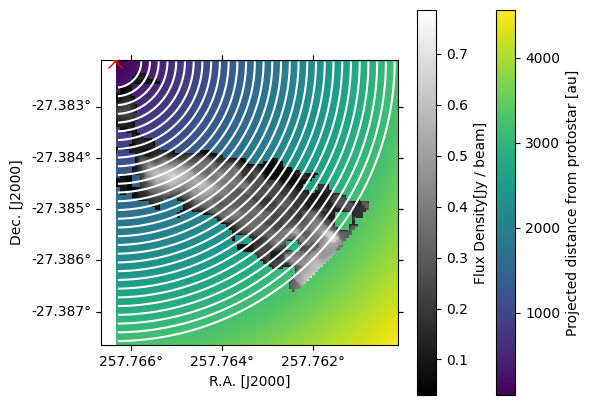

In [49]:
## Checking if the grid works as expected

fig = plt.figure(figsize=(6, 5))
ax = fig.add_subplot(111, projection=scubevc2.wcs.celestial)
im = ax.imshow(rel_off_au)
im2 = ax.imshow(unumpy.nominal_values(total_flux_density.value),cmap='grey')
plt.contour(rel_off_au,levels = off_bounds,colors='white')
ref_x,ref_y = scubevc2.wcs.celestial.world_to_pixel_values(ref_ra,ref_dec)
plt.plot(ref_x,ref_y,'rx',markersize='10')
lon = ax.coords[0]
lat = ax.coords[1]
lon.set_major_formatter('d.ddd')
lat.set_major_formatter('d.ddd')
lon.set_axislabel('R.A. [J2000]')
lat.set_axislabel('Dec. [J2000]')
plt.colorbar(im,label="Projected distance from protostar [au]")
plt.colorbar(im2,label=f"Flux Density[{total_flux_density.unit}]")

In [50]:
## Computing total gas mass within all the intervals

Mgas_off = []
e_Mgas_off = []
for i in range(len(off_bounds[:-1])):
    off_bound_lo = off_bounds[i] #lower bound of offset distances
    off_bound_hi = off_bounds[i+1] #upper bound of offset distances
    off_mask = (rel_off_au>=off_bound_lo)& (rel_off_au<off_bound_hi) #indices within these bounds
    Mgas_off_arr = Mgas[off_mask] #mass of pixels within these bounds
    tot_Mgas = np.nansum(Mgas_off_arr).to(u.solMass).value # Total mass
    print(i,tot_Mgas)
    if tot_Mgas != 0:
        Mgas_off += [tot_Mgas.n]
        e_Mgas_off += [tot_Mgas.s]
    else:
        print("tot_Mgas is 0, finishing loop")
        break
    # print(i, off_bound_lo,off_bound_hi,sum(off_mask.flatten()==True),tot_Mgas) 

Mgas_r = unumpy.uarray(Mgas_off,e_Mgas_off)*Mgas_unit # Making the final array with errors and units

0 (5.4+/-1.7)e-06
1 (6.9+/-2.1)e-06
2 (9.1+/-2.8)e-06
3 (8.2+/-2.5)e-06
4 (4.5+/-1.4)e-06
5 (2.0+/-0.6)e-06
6 (4.6+/-1.4)e-06
7 (6.6+/-2.0)e-06
8 (1.2+/-0.4)e-05
9 (2.7+/-0.8)e-05
10 (4.8+/-1.5)e-05
11 (6.7+/-2.0)e-05
12 (7.4+/-2.3)e-05
13 (6.2+/-1.9)e-05
14 (5.7+/-1.7)e-05
15 (6.0+/-1.8)e-05
16 (4.7+/-1.4)e-05
17 (4.5+/-1.4)e-05
18 (4.4+/-1.4)e-05
19 (4.0+/-1.2)e-05
20 (4.3+/-1.3)e-05
21 (4.5+/-1.4)e-05
22 (4.2+/-1.3)e-05
23 (4.2+/-1.3)e-05
24 (4.9+/-1.5)e-05
25 (4.9+/-1.5)e-05
26 (5.4+/-1.7)e-05
27 (6.2+/-1.9)e-05
28 (6.4+/-1.9)e-05


Text(0, 0.5, 'Gas mass [M$_{\\odot}$]')

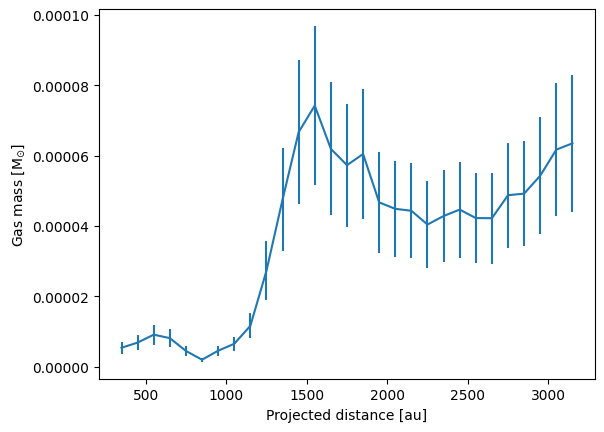

In [51]:
plt.errorbar(off_means,unumpy.nominal_values(Mgas_r.value),yerr=unumpy.std_devs(Mgas_r.value))
plt.xlabel('Projected distance [au]')
plt.ylabel(r'Gas mass [M$_{\odot}$]')

In [52]:
## Getting timestamps for all these intervals

complete_trajectory = falling_trajectory(perrs.loc['x0', 'value'], perrs.loc['y0', 'value'], perrs.loc['z0', 'value'],
                   perrs.loc['vx0', 'value'], perrs.loc['vy0', 'value'], perrs.loc['vz0', 'value'],
                   Ms_val.value)
dist2d_trajectory = np.sqrt(complete_trajectory[0][0]**2+complete_trajectory[0][1]**2) # Projected distance on POS
dist3d_trajectory = complete_trajectory[2][0] # Distances in 3D
times_trajectory = complete_trajectory[4] # Time stamps from the beginning
inf_times_trajectory = np.abs(times_trajectory-perrs.loc['final_time','value']) # Difference between time stamp and final time, equivalent to infalling time

interp_time_2ddist = interp1d(dist2d_trajectory,inf_times_trajectory,fill_value='extrapolate',kind='slinear') # interpolation function
inf_times_off_bounds = interp_time_2ddist(off_bounds) # interpolating time to offset bounds
meant_off = (inf_times_off_bounds[1:]+inf_times_off_bounds[:-1])/2 # Mean infalling time within offset bounds
dt_off = inf_times_off_bounds[1:]-inf_times_off_bounds[:-1] # Time to go between upper to lower bounds 
# meant_off,dt_off

Initial coords in rotated cartesian frame: [-2.27373675e-13  3.39871039e+03 -1.13686838e-13]
Initial coords in spherical frame: [3.39871039e+03 1.57079633e+00 1.57079633e+00]
Can we get back the original coords?: True
Initial vel. in rotated cartesian frame: [-2.13303207e-01 -3.57538882e-01  1.73472348e-17]
Initial vel. in spherical frame: [-3.57538882e-01 -3.92401771e-17  2.13303207e-01]
Total energy: -0.4954061371791574 km2 / s2
Orbit eccentricity: 0.9310986330565024


Text(0, 0.5, 'Infalling time from here [yr]')

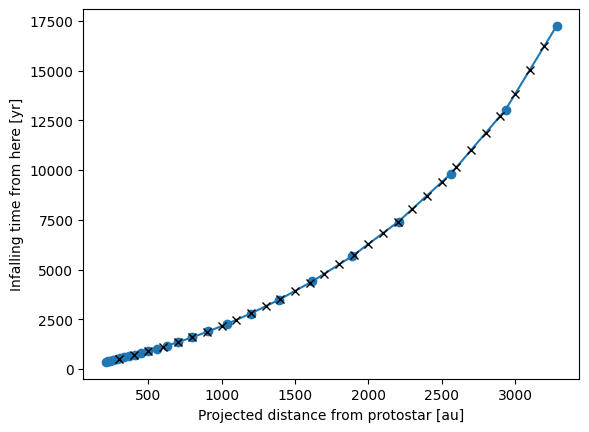

In [53]:
## Checing if time interpolation worked properly

plt.plot(dist2d_trajectory,inf_times_trajectory,'o-')
plt.plot(off_bounds,inf_times_off_bounds,'kx')
plt.xlabel(r'Projected distance from protostar [au]')
plt.ylabel(r'Infalling time from here [yr]')

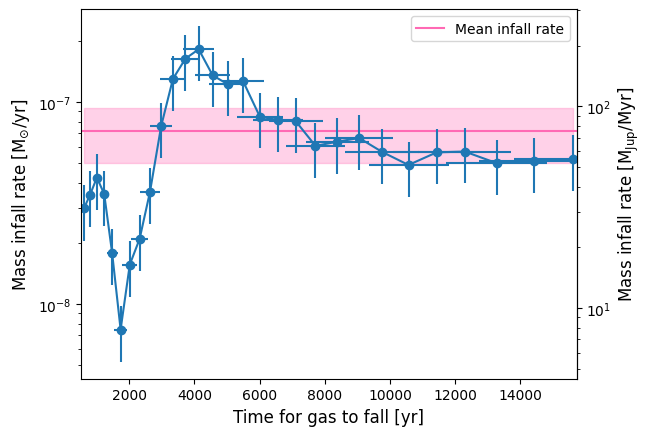

In [54]:
Minf_r = Mgas_r/dt_off # Mass infall rate estimates within each bin

frac_err_t = perrs.loc['final_time'].error/perrs.loc['final_time'].value  #typical fractional uncertainty on time
t_err = meant_off*frac_err_t # Errors in timestamps

plt.axhline(y=M_infrate.value.n,color='hotpink',label='Mean infall rate')
plt.fill_between(meant_off, M_infrate.value.n - M_infrate.value.s, M_infrate.value.n + M_infrate.value.s,color='hotpink', alpha=0.3)#, label='Uncertainty')
plt.errorbar(meant_off,unumpy.nominal_values(Minf_r.value),yerr=unumpy.std_devs(Minf_r.value),xerr = t_err,fmt='o-')#,label='Rates after correction')
# plt.plot(meant_off,unumpy.nominal_values(Minf_r.value)/missing_mass_fac.value.n,'-',linewidth='0.5',color='grey',label='Rates before correction')

ax = plt.gca()
to_jup_per_myr = lambda y: y * (u.M_sun / u.yr).to(u.M_jup / u.Myr)
to_sun_per_yr = lambda y: y * (u.M_jup / u.Myr).to(u.M_sun / u.yr)
secax = ax.secondary_yaxis('right', functions=(to_jup_per_myr, to_sun_per_yr))
secax.set_ylabel(r'Mass infall rate [M$_{\text{Jup}}$/Myr]',size='large')

plt.yscale('log')
plt.legend()
plt.ylabel(r'Mass infall rate [M$_{\odot}$/yr]',size='large')
plt.xlabel(r'Time for gas to fall [yr]',size='large')
plt.xlim(min(meant_off)-100,max(meant_off)+100)

plt.savefig(output_dir+fits_nam[:-11]+'_infall_variation.png',dpi=300,bbox_inches = 'tight')